<h1 align="center"> Results </h1>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from config import path

In [2]:
import logging
from logs import turning_logger

turning_logger.setLevel(logging.INFO)

In [3]:
SPORTS = ("basketball", "handball", "soccer", "volleyball")

path.PLOT_PATH.mkdir(parents=True, exist_ok=True)

<h2> Dataset </h2>

In [4]:
from data_analysis.read_datasets import read_as_dicts

In [5]:
KEYS_TO_READ = [
    "matches",
    "var_stats",
    "tp",
    "permuted_tp",
    "optimal_tp",
    "diff_points_tp",
]

key_to_sport_to_data = read_as_dicts(SPORTS, KEYS_TO_READ)

In [6]:
from turning_point.match_coefficient import MatchTurningPoint

key_to_sport_to_data["mtp"] = {
    sport: MatchTurningPoint.from_matches_and_turning_point(
        key_to_sport_to_data["matches"][sport],
        key_to_sport_to_data["tp"][sport]
    )
    for sport in SPORTS
}

In [7]:
import warnings
from turning_point.permutation_coefficient import TurningPointComparison

PERCENTILES = [2.5, 25, 50, 75, 97.5]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    key_to_sport_to_data["comparison_tp"] = {
        sport: TurningPointComparison(
            key_to_sport_to_data["tp"][sport], 
            key_to_sport_to_data["permuted_tp"][sport],
            key_to_sport_to_data["optimal_tp"][sport],
        ).comparison(PERCENTILES)
        for sport in SPORTS
    }

<h2> Style </h2>

In [8]:
import data_analysis.plots.utils.customization
from data_analysis.plots.utils.plot_functions import flatten_axes

In [9]:
from data_analysis.plots.variances_temporal_progression import plot_variances_temporal_progression
from data_analysis.plots.turning_point_boxplot import plot_boxplot_turning_points
from data_analysis.plots.comparison_boxplot import plot_comparison_boxplot
from data_analysis.plots.new_pontuation import plot_new_pontuation_system
from data_analysis.plots.comparison_scatter import plot_comparison_scatter

<h2> Temporal Progression </h2>

In [10]:
TOURNEY_NAMES_AND_IDS = (
    ("NBA (Basketball - 2019/2020)", "nba@/basketball/usa/nba-2019-2020/"),
    ("Superleague - RU (Volleyball - 2019/2020)", "superleague@/volleyball/russia/superleague-2019-2020/"),
    ("La Liga (Soccer - 2019/2020)", "laliga@/soccer/spain/laliga-2019-2020/"),
    ("Bundesliga (Handball - 2019/2020)", "bundesliga@/handball/germany/bundesliga-2019-2020/"),
)
LAST_DATE = 60

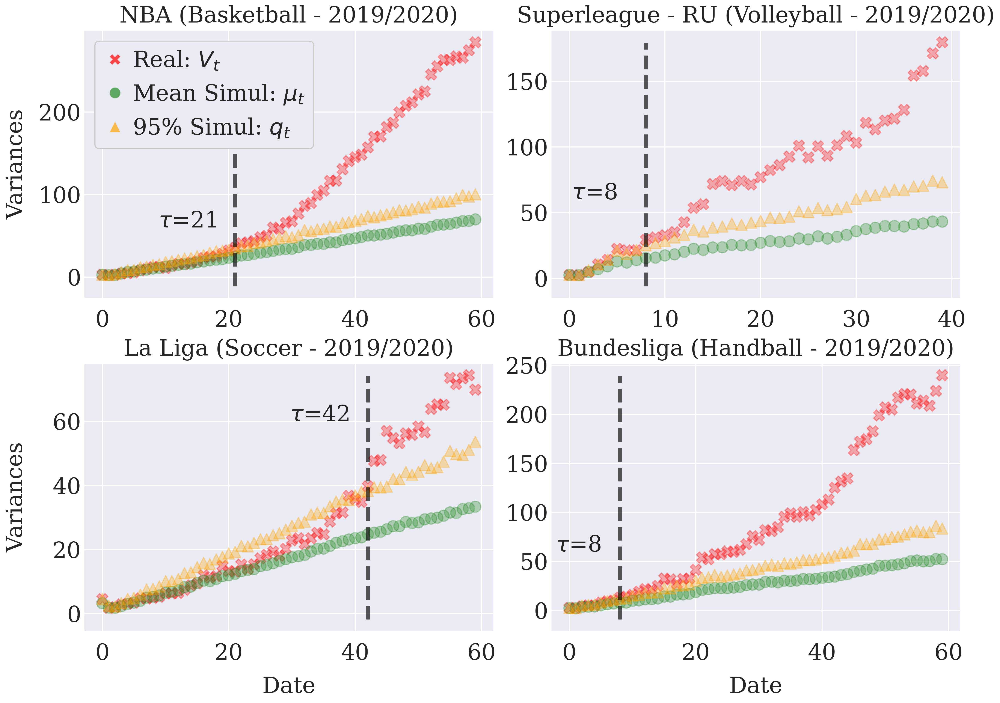

In [11]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13))

plot_variances_temporal_progression(
    fig, axs,
    key_to_sport_to_data["tp"],
    key_to_sport_to_data["var_stats"],
    TOURNEY_NAMES_AND_IDS,
    LAST_DATE,
)
for ax in flatten_axes(axs):
    ax.set_title(ax.get_title(), fontsize=30)

plt.savefig(path.PLOT_PATH / "variance_progression.pdf")

<h2> Turning Point </h2>

<h3> All tournaments </h3>

In [12]:
MTP_TP_COLUMNS = {
    "match turning point": "Matches",
    "%turning point": "%Date"
}

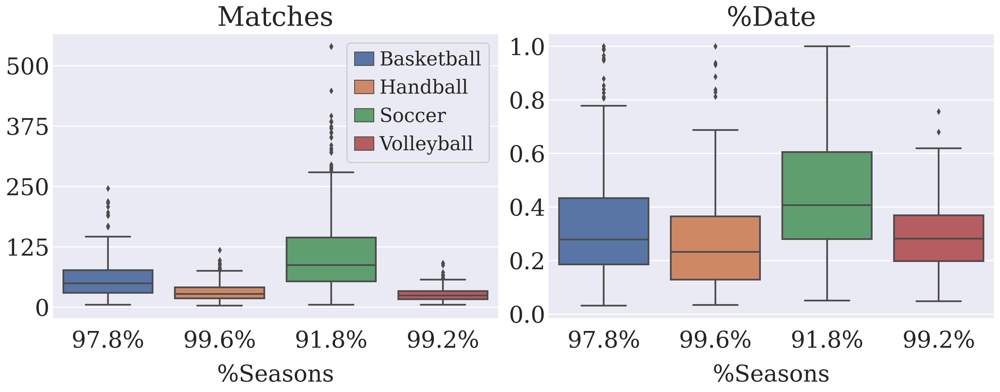

In [13]:
fig, axs = plt.subplots(ncols=2, figsize=(18, 7))

plot_boxplot_turning_points(
    axs,
    key_to_sport_to_data["tp"],
    key_to_sport_to_data["mtp"],
    MTP_TP_COLUMNS,
)

axs[0].set_yticks([0, 125, 250, 375, 500])

plt.savefig(path.PLOT_PATH / "turning_point_all_tournaments_boxplot.pdf")

<h3> Division </h3>

In [14]:
from data_analysis.division import Division

div_data = Division(pd.read_csv(path.DATA_PATH / "divisions.csv"))
div_data.df.value_counts(["sport", "division"]).sort_index()

sport       division
basketball  1           35
handball    1           30
soccer      1           62
            2           15
            3            3
volleyball  1           29
            2            1
dtype: int64

In [15]:
SPORT = "soccer"
tp_df = key_to_sport_to_data["tp"][SPORT].df

div_df = pd.concat(
    {div: tp_df.loc[div_data.filter_division_in_index(tp_df, div)] for div in [1, 2]},
    axis="columns"
)

In [16]:
infinite_percent_div1 = np.mean(div_df[(1, "%turning point")].dropna() < 2)
infinite_percent_div2 = np.mean(div_df[(2, "%turning point")].dropna() < 2)

HUE_COLUMNS = {
    (1, "%turning point"): f"First\n{infinite_percent_div1:.1%}",
    (2, "%turning point"): f"Second\n{infinite_percent_div2:.1%}",
}

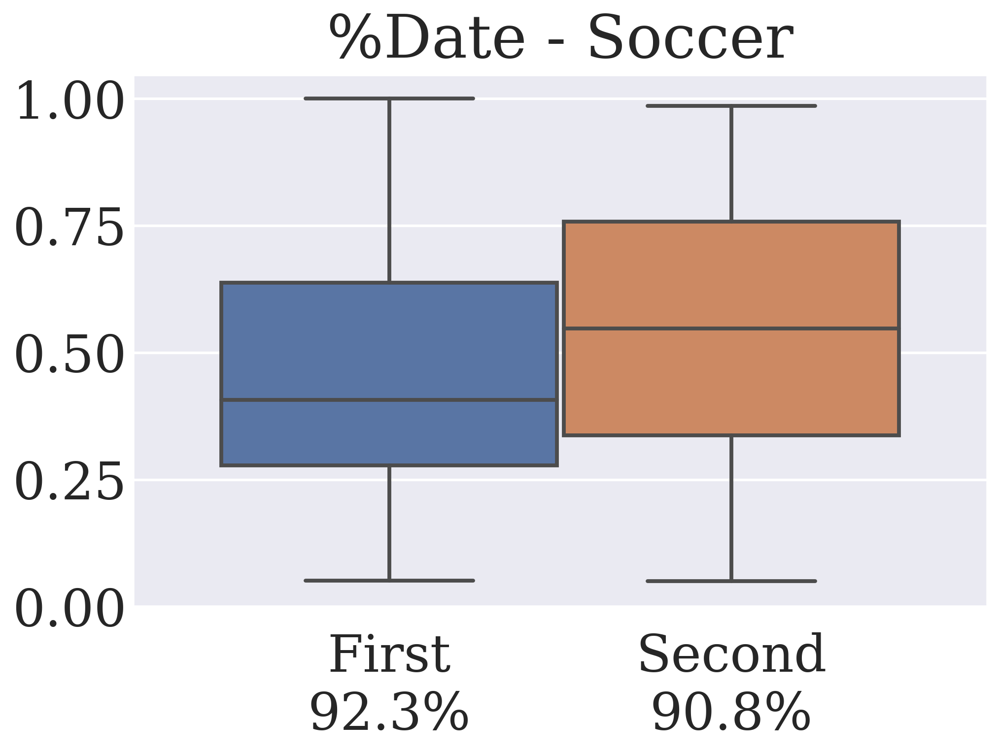

In [17]:
_, ax = plt.subplots(figsize=(8, 6))
plot_comparison_boxplot(ax, {"soccer": div_df}, hue_columns=HUE_COLUMNS, legend=False)

ax.set_title("%Date - Soccer")
ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_xticks([-0.20, 0.20], HUE_COLUMNS.values())

plt.savefig(path.PLOT_PATH / "division_comparison_boxplot.pdf")

<h3> Other Pontuation System </h3>

In [18]:
other_pontuation = {
    "volleyball": pd.concat(
            {
            "normal": key_to_sport_to_data["tp"]["volleyball"].df,
            "new": key_to_sport_to_data["diff_points_tp"]["volleyball"].df,
        }, axis="columns"
    )
}

In [19]:
TP_COLUMNS = {
    ("normal", "%turning point"): "3:2 - (3, 0)",
    ("new", "%turning point"): "3:2 - (2, 1)",
}

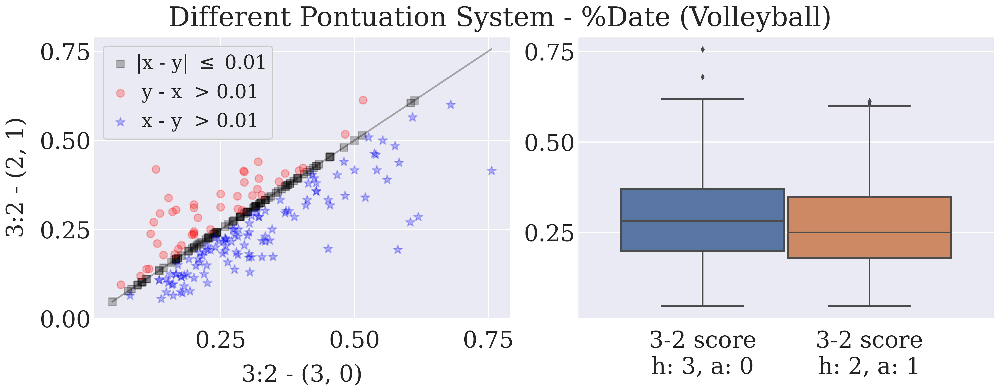

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(18, 7))

plot_new_pontuation_system(fig, axs, other_pontuation, tp_columns=TP_COLUMNS, no_difference_margin=0.01)
axs[0].legend(fontsize=25)
fig.suptitle("Different Pontuation System - %Date (Volleyball)", size=35)

plt.savefig(path.PLOT_PATH / "new_pontuation_system.pdf")

<h2> Permuted Turning Point </h2>

<h3> All tournaments </h3>

In [21]:
HUE_COLUMNS = {
    ("%turning point", "normal"): "Real",
    ("%turning point", "mean"): "Expected",
}

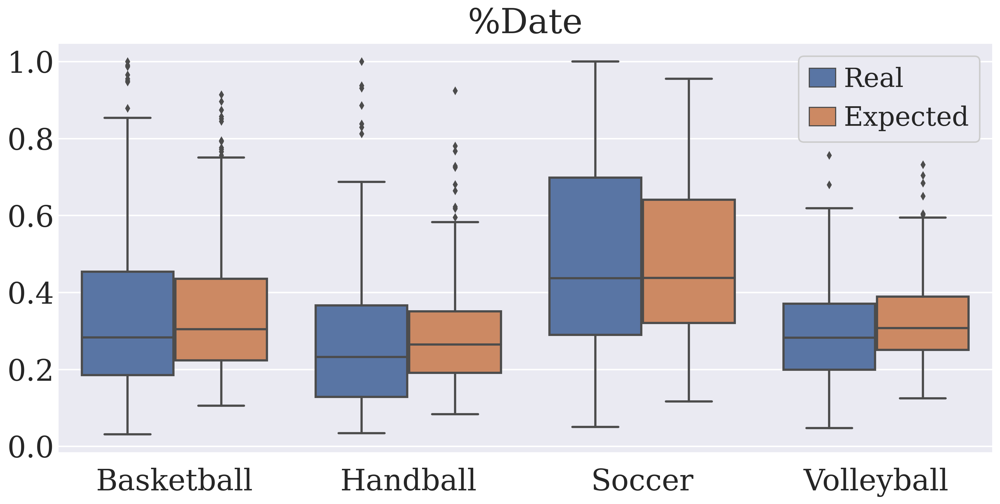

In [22]:
_, ax = plt.subplots(figsize=(14, 7))
plot_comparison_boxplot(
    ax,
    key_to_sport_to_data["comparison_tp"],
    x_column="sport",
    hue_columns=HUE_COLUMNS
)

ax.set_title("%Date")
ax.legend(fontsize=27)

plt.savefig(path.PLOT_PATH / "normal_permuted_comparison_boxplot.pdf")

<h3> Scatter Comparison </h3>

In [23]:
TP_COLUMNS = {
    ("%turning point", "normal"): "Real",
    ("%turning point", "mean"): "Expected",
}

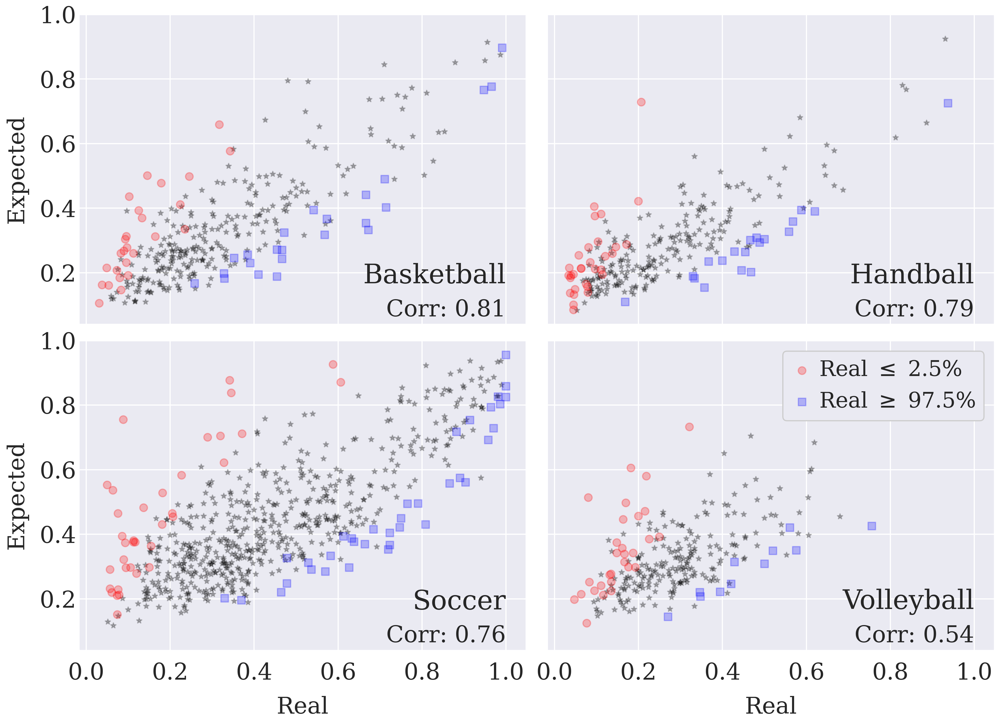

In [24]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

plot_comparison_scatter(
    fig, axs,
    key_to_sport_to_data["comparison_tp"],
    TP_COLUMNS,
    no_difference_margin=None,
    x_equals_y_line=False,
)

flat_axs[0].set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
flat_axs[3].legend(loc="upper right", fontsize=28)

plt.savefig(path.PLOT_PATH / "turning_point_permuted_comparison_scatter.pdf")

<h2> Optimal Turning Point </h2>

<h3> Oracle </h3>

In [25]:
from data_analysis.plots.comparison_scatter import plot_comparison_scatter

TP_COLUMNS = {
    ("%turning point", "normal"): "Real",
    # ("%turning point", "mean"): "Expected",
    ("%turning point", "tp_maximizer-current"): "Oracle Maximizer",
}

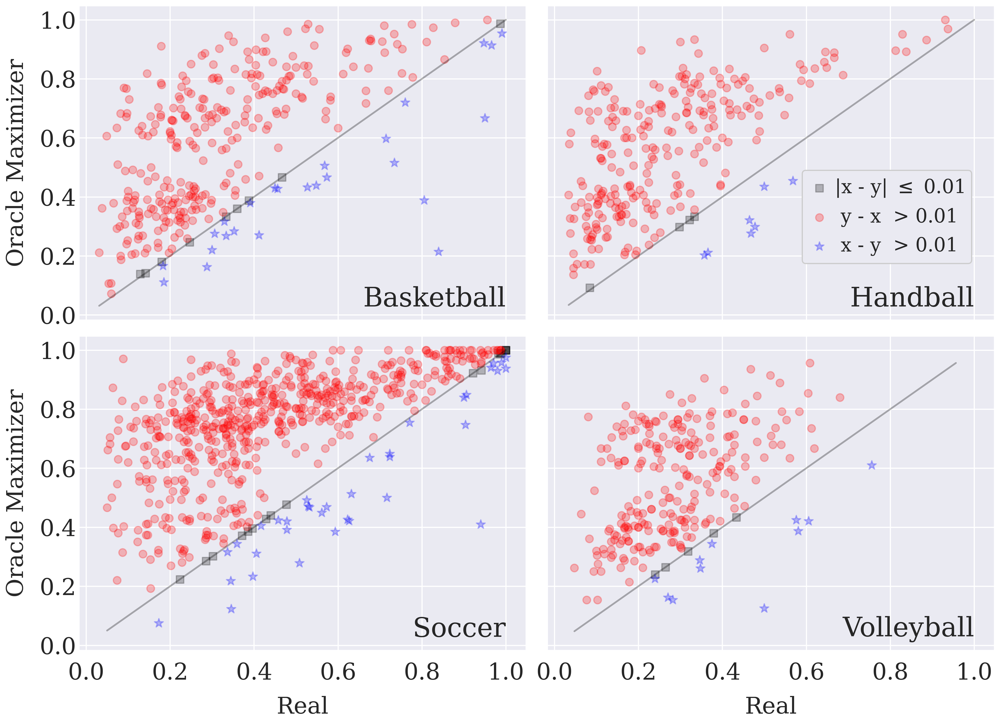

In [26]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

plot_comparison_scatter(
    fig, axs,
    key_to_sport_to_data["comparison_tp"],
    TP_COLUMNS,
    pearson_corr_kwargs=None,
    title_as_text_kwargs={"y": 0.01},
    no_difference_margin=0.01,
)

flat_axs[1].legend(loc=(0.57, 0.18), fontsize=25)

plt.savefig(path.PLOT_PATH / "turning_point_oracle_maximizer_comparison_scatter.pdf")

<h3> Yesterday Model </h3>

In [27]:
from data_analysis.plots.comparison_scatter import plot_comparison_scatter

TP_COLUMNS = {
    ("%turning point", "normal"): "Real",
    # ("%turning point", "mean"): "Expected",
    ("%turning point", "tp_maximizer-previous"): "Yesterday Maximizer",
}

div1_comparison = {
    sport: comparison.loc[div_data.filter_division_in_index(comparison, division=1)]
    for sport, comparison in key_to_sport_to_data["comparison_tp"].items()
}

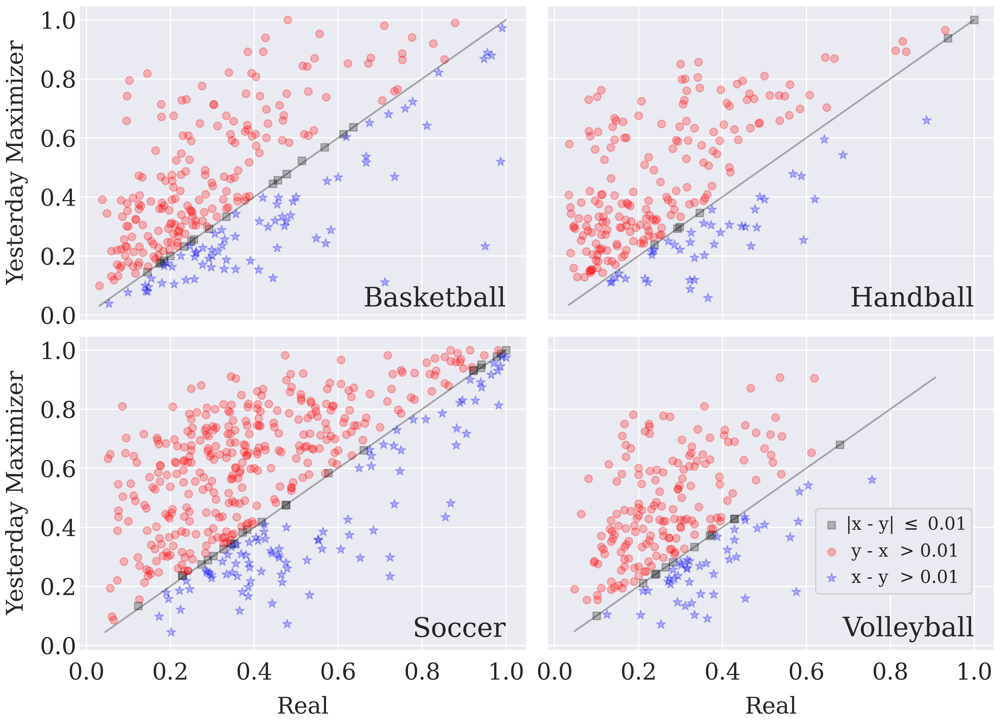

In [28]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

plot_comparison_scatter(
    fig, axs,
    div1_comparison,
    TP_COLUMNS,
    pearson_corr_kwargs=None,
    title_as_text_kwargs={"y": 0.01},
    no_difference_margin=0.01,
)

flat_axs[-1].legend(loc=(0.6, 0.18), fontsize=23)

plt.savefig(path.PLOT_PATH / "turning_point_yesterday_maximizer_comparison_scatter.pdf")

<h2> Numerical Analysis </h2>

<h3> Statistical data </h3>

All tournaments

In [29]:
from data_analysis.numeric_analysis import get_statistical_information

COLUMNS = [("turning point", "normal"), ("%turning point", "normal")]
get_statistical_information(key_to_sport_to_data["comparison_tp"], COLUMNS)

basketball    handball      soccer  volleyball
tp_type        tp_data                                                      
turning point  normal  count  315.000000  262.000000  641.000000  254.000000
                       mean    22.622222   13.698473   35.756630   10.547244
                       std     17.000191   10.146660   22.540798    6.139013
                       min      2.000000    1.000000    2.000000    1.000000
                       25%     11.000000    7.000000   19.000000    6.000000
                       50%     18.000000   11.000000   30.000000    9.000000
                       75%     30.000000   17.000000   48.000000   13.000000
                       max    106.000000   70.000000  119.000000   30.000000
%turning point normal  count  315.000000  262.000000  641.000000  254.000000
                       mean     0.332943    0.272570    0.457314    0.291447
                       std      0.207595    0.183470    0.238378    0.128916
                       min      0.031056    0.033898    0.050000    0.047619
                       25%      0.184826    0.128571    0.279570    0.197541
                       50%      0.277778    0.232013    0.406780    0.281651
                       75%      0.432634    0.364948    0.604651    0.368687
                       max      1.000000    1.000000    1.000000    0.756098

New Pontuation System

In [30]:
to_multiply = [["normal", "new"], ["turning point", "%turning point"]]
NEW_POINTS_COLUMNS = pd.MultiIndex.from_product(to_multiply)

In [31]:
get_statistical_information(other_pontuation, NEW_POINTS_COLUMNS).unstack(["tp_type", "tp_data"])

volleyball                                            
tp_type        normal                          new               
tp_data turning point %turning point turning point %turning point
count      254.000000     254.000000    255.000000     255.000000
mean        10.547244       0.291447      9.686275       0.268838
std          6.139013       0.128916      5.690475       0.120096
min          1.000000       0.047619      1.000000       0.047619
25%          6.000000       0.197541      5.000000       0.179029
50%          9.000000       0.281651      9.000000       0.250000
75%         13.000000       0.368687     12.000000       0.346197
max         30.000000       0.756098     29.000000       0.612903

<h3> Optimal Turning Point </h3>

In [32]:
from data_analysis.numeric_analysis import get_optimal_comparison

TP_TYPE = "%turning point"
OPTIMAL_COLUMNS = [
    "tp_minimizer-current",
    "tp_minimizer-previous",
    "tp_maximizer-current",
    "tp_maximizer-previous"
]

all_sports_df = pd.concat(key_to_sport_to_data["comparison_tp"]).reset_index(0, drop=True)
all_sport_df_div1 = all_sports_df.loc[div_data.filter_division_in_index(all_sports_df, division=1)]

sport_to_comparison = key_to_sport_to_data["comparison_tp"] | {"total": all_sports_df}
sport_to_comparison_div1 = div1_comparison | {"total": all_sport_df_div1}

optimal_comp = get_optimal_comparison(
    sport_to_comparison,
    OPTIMAL_COLUMNS, 
    TP_TYPE
)
optimal_div1_comp = get_optimal_comparison(
    sport_to_comparison_div1,
    OPTIMAL_COLUMNS, 
    TP_TYPE
)
pd.concat({"all": optimal_comp, "div1": optimal_div1_comp}, axis="columns")

all                                \
                                    < 2.5%    < real    < mean    > mean   
optimal col           sport                                                
tp_minimizer-current  basketball  0.577640  0.829193  0.903727  0.077640   
                      handball    0.577947  0.870722  0.977186  0.019011   
                      soccer      0.598854  0.826648  0.852436  0.065903   
                      volleyball  0.582031  0.863281  0.949219  0.042969   
                      total       0.588044  0.840806  0.900585  0.056530   
tp_minimizer-previous basketball  0.254658  0.580745  0.714286  0.158385   
                      handball    0.349810  0.650190  0.794677  0.087452   
                      soccer      0.216332  0.571633  0.601719  0.214900   
                      volleyball  0.300781  0.605469  0.738281  0.136719   
                      total       0.261209  0.592593  0.680962  0.168291   
tp_maximizer-current  basketball  0.003106  0.077640  0.086957  0.888199   
                      handball    0.000000  0.026616  0.030418  0.961977   
                      soccer      0.002865  0.055874  0.042980  0.875358   
                      volleyball  0.003906  0.042969  0.050781  0.941406   
                      total       0.002599  0.053281  0.051332  0.903834   
tp_maximizer-previous basketball  0.018634  0.226708  0.260870  0.608696   
                      handball    0.007605  0.159696  0.155894  0.730038   
                      soccer      0.014327  0.214900  0.202006  0.611748   
                      volleyball  0.027344  0.175781  0.187500  0.687500   
                      total       0.016244  0.201429  0.204029  0.643925   

                                                          div1            \
                                    > real   > 97.5%    < 2.5%    < real   
optimal col           sport                                                
tp_minimizer-current  basketball  0.130435  0.000000  0.577640  0.829193   
                      handball    0.076046  0.003802  0.577947  0.870722   
                      soccer      0.081662  0.001433  0.577982  0.818349   
                      volleyball  0.093750  0.003906  0.581028  0.865613   
                      total       0.092917  0.001949  0.578453  0.839479   
tp_minimizer-previous basketball  0.248447  0.018634  0.254658  0.580745   
                      handball    0.159696  0.003802  0.349810  0.650190   
                      soccer      0.227794  0.012894  0.251376  0.603670   
                      volleyball  0.203125  0.011719  0.304348  0.604743   
                      total       0.216374  0.012346  0.280550  0.607375   
tp_maximizer-current  basketball  0.875776  0.599379  0.003106  0.077640   
                      handball    0.958175  0.737643  0.000000  0.026616   
                      soccer      0.842407  0.621777  0.003670  0.060550   
                      volleyball  0.929688  0.585938  0.003953  0.043478   
                      total       0.883691  0.630929  0.002892  0.054953   
tp_maximizer-previous basketball  0.593168  0.214286  0.018634  0.226708   
                      handball    0.703422  0.365019  0.007605  0.159696   
                      soccer      0.581662  0.250716  0.011009  0.174312   
                      volleyball  0.652344  0.234375  0.027668  0.177866   
                      total       0.616634  0.259909  0.015184  0.184382   

                                                                          
                                    < mean    > mean    > real   > 97.5%  
optimal col           sport                                               
tp_minimizer-current  basketball  0.903727  0.077640  0.130435  0.000000  
                      handball    0.977186  0.019011  0.076046  0.003802  
                      soccer      0.847706  0.075229  0.093578  0.001835  
                      volleyball  0.948617  0.043478  0.090909  0.003953  
                

<h3> No Turning Points </h3>

In [33]:
from data_analysis.numeric_analysis import get_no_tp

DESIRED_COLUMNS = [("%turning point", "mean"), ("%turning point", "normal")] 

no_tp = get_no_tp(sport_to_comparison, DESIRED_COLUMNS)
no_tp.groupby("sport").size()

sport
basketball     8
handball       2
soccer        66
total         78
volleyball     2
dtype: int64

In [34]:
total_seasons = sum(
    key_to_sport_to_data["tp"][sport].df.index.unique().size
    for sport in SPORTS
)

no_tp.index.get_level_values("id").unique().size / total_seasons

0.050682261208576995

<h3> Mean per tournament </h3>

In [35]:
from data_analysis.numeric_analysis import get_mean_per_tournament
sport_order = ["soccer", "basketball", "volleyball", "handball"]

COLUMNS = [
    ("%turning point", "normal"),
    ("%turning point", "mean"),
    ("%turning point", "tp_maximizer-current"),
    ("%turning point", "tp_maximizer-previous"),
]

mean_per_tournament = get_mean_per_tournament(
    key_to_sport_to_data["comparison_tp"],
    COLUMNS
)

mean_per_tournament.groupby("sport").nth(list(range(3))).loc[sport_order]

%turning point                                                     
                   normal      mean tp_maximizer-current tp_maximizer-previous
sport                                                                         
soccer           0.229184  0.227335             0.628124              0.421894
soccer           0.241687  0.236223             0.587763              0.435963
soccer           0.337526  0.252033             0.706636              0.554226
basketball       0.120304  0.131669             0.342517              0.170598
basketball       0.114362  0.177180             0.138943              0.166122
basketball       0.227127  0.220544             0.550545              0.311195
volleyball       0.171699  0.207703             0.277893              0.296505
volleyball       0.242186  0.223781             0.398491              0.397512
volleyball       0.256925  0.240703             0.556659              0.399358
handball         0.143985  0.157723             0.345659              0.312733
handball         0.135127  0.162174             0.441196              0.380761
handball         0.126381  0.190863             0.467608              0.320581